In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime as dt
import math

https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks

In [3]:
df = pd.read_csv('data.csv')

In [3]:
df.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

### Exploratory Data Analysis

#### valence

In [5]:
df['valence'].describe()

count    170653.000000
mean          0.528587
std           0.263171
min           0.000000
25%           0.317000
50%           0.540000
75%           0.747000
max           1.000000
Name: valence, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


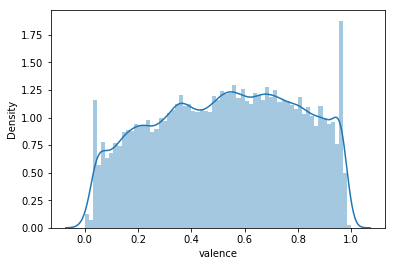

In [6]:
plt.figure(figsize=(6,4))
sns.distplot(df['valence'],bins='auto')

In [7]:
df[df['valence']==1]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
29984,1.0,1977,0.3390,['Raffi'],0.878,51547,0.255,0,0CgeqYC6ipphjyxgrs1mmZ,0.00001,2,0.0876,-14.140,1,Les Petites Marionettes,42,1977,0.0753,106.649
40649,1.0,1937,0.9400,['Raymond Scott'],0.738,18855,0.314,0,53nhbx7yp4TJEpmMBCLWPQ,0.21100,1,0.5640,-11.818,1,Chatter,0,1937,0.8580,119.255
53764,1.0,2002,0.0776,['Montez de Durango'],0.912,200213,0.824,0,3rHsX3TLPYixr7eGzRlZqI,0.54100,9,0.0260,-5.163,1,Pasito Duranguense,50,2002-01-04,0.0831,144.925
105668,1.0,2005,0.0180,['Spongebob Squarepants'],0.723,35613,0.844,0,56KyV36puztkiJ62ca3D1t,0.88700,10,0.0341,-8.684,0,Electric Zoo,48,2005-11-15,0.0719,164.920


In [8]:
df[df['valence']==0]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
508,0.0,1924,0.99600,['Ignacio Corsini'],0.000,133947,0.025800,0,2WTtJDfCUjAyCZHRSfCLDn,0.76800,5,0.0831,-24.894,1,La Mina del Ford - Remasterizado,0,1924-03-29,0.000,0.000
591,0.0,1924,0.99600,['Francisco Canaro'],0.000,170253,0.315000,0,5tQsQaMquCXBREb1FNymi7,0.95600,8,0.3750,-15.969,0,Oh Mujer Mujer - Remasterizado,0,1924-07-12,0.000,0.000
978,0.0,1926,0.95800,['Iván Rolón'],0.702,41719,0.001760,0,03xTkOTe36kugZ1pd6NxxN,0.62200,11,0.0974,-38.295,0,"Cuatro melodías al unísono, No. III",0,1926,0.308,98.985
2578,0.0,1934,0.00244,['The Moors'],0.000,14629,0.801000,0,29IVdlO7CSlcoOIpOsamkO,0.00125,4,0.0503,-0.671,0,Santa Claus Is Coming To Town,0,1934,0.000,0.000
2764,0.0,1935,0.93600,['Orquesta Francisco Canaro'],0.000,211880,0.202000,0,1QXbWUSsLWPtHrbZ7H8o9i,0.01370,6,0.1200,-12.399,1,Tu Y Yo,4,1935-01-01,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169591,0.0,2015,0.46900,['$uicideBoy$'],0.000,153809,0.630000,1,00CutyaH2ljgLtM0nM5LLd,0.37500,2,0.1270,-6.707,1,Clouds As Witnesses,52,2015-03-03,0.000,0.000
169717,0.0,2016,0.12700,"['Rain Sounds', 'Rain Sounds & White Noise', '...",0.000,93452,0.000062,0,6HMSnRW8Htfd3YxdNgUF73,0.99900,9,0.7180,-18.685,1,Pouring Rain,54,2016-03-01,0.000,0.000
169935,0.0,2017,0.42000,['Granular'],0.000,180656,0.001720,0,03sJaTenPLeRaVUISW6pI5,0.39900,4,0.1100,-27.848,0,Pink Noise - BP 240 hz,61,2017-11-24,0.000,0.000
169968,0.0,2017,0.96200,['Fabricants'],0.000,175680,0.000020,0,4UYLGTJRGCt4KzP9r9Y9bH,0.02800,11,0.1370,-52.220,0,Brain Relaxation,57,2017-01-18,0.000,0.000


#### year

In [9]:
df['year'].describe()

count    170653.000000
mean       1976.787241
std          25.917853
min        1921.000000
25%        1956.000000
50%        1977.000000
75%        1999.000000
max        2020.000000
Name: year, dtype: float64

In [10]:
df.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [11]:
df['decade'] = df['year']//10

In [12]:
pd.set_option('display.max_rows', None)

x = pd.DataFrame(df.groupby('decade')['id'].count()/df.shape[0]).reset_index()
x['decade'] = x['decade']*10
x.columns = ['decade','fraction of tracks']
x

,decade,fraction of tracks
0,1920,0.030038
1,1930,0.055956
2,1940,0.090113
3,1950,0.116318
4,1960,0.114554
5,1970,0.117197
6,1980,0.116318
7,1990,0.116617
8,2000,0.115123
9,2010,0.115873


In [63]:
df = df.drop(columns=['decade'])

In [64]:
pd.set_option('display.max_rows',20)

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


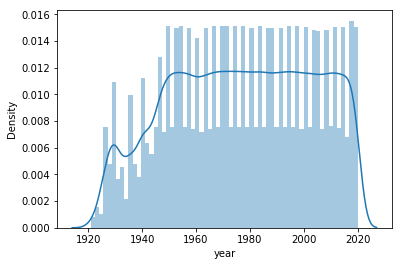

In [65]:
plt.figure(figsize=(6,4))
sns.distplot(df['year'],bins='auto')

In [66]:
df[df['year']==df['year'].max()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
19606,0.756,2020,0.22100,"['24kGoldn', 'iann dior']",0.700,140526,0.722,1,3tjFYV6RSFtuktYl3ZtYcq,0.000000,7,0.2720,-3.558,0,Mood (feat. iann dior),99,2020-07-24,0.0369,90.989
19607,0.347,2020,0.11400,"['Pop Smoke', 'Lil Baby', 'DaBaby']",0.823,190476,0.586,1,0PvFJmanyNQMseIFrU708S,0.000000,6,0.1930,-6.606,0,For The Night (feat. Lil Baby & DaBaby),95,2020-07-03,0.2000,125.971
19608,0.357,2020,0.01940,"['Cardi B', 'Megan Thee Stallion']",0.935,187541,0.454,1,4Oun2ylbjFKMPTiaSbbCih,0.000000,1,0.0824,-7.509,1,WAP (feat. Megan Thee Stallion),96,2020-08-07,0.3750,133.073
19609,0.522,2020,0.24400,"['Drake', 'Lil Durk']",0.761,261493,0.518,1,2SAqBLGA283SUiwJ3xOUVI,0.000035,0,0.1070,-8.871,1,Laugh Now Cry Later (feat. Lil Durk),93,2020-08-14,0.1340,133.976
19610,0.682,2020,0.46800,['Ariana Grande'],0.737,172325,0.802,1,35mvY5S1H3J2QZyna3TFe0,0.000000,0,0.0931,-4.771,1,positions,96,2020-10-30,0.0878,144.015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170648,0.608,2020,0.08460,"['Anuel AA', 'Daddy Yankee', 'KAROL G', 'Ozuna...",0.786,301714,0.808,0,0KkIkfsLEJbrcIhYsCL7L5,0.000289,7,0.0822,-3.702,1,China,72,2020-05-29,0.0881,105.029
170649,0.734,2020,0.20600,['Ashnikko'],0.717,150654,0.753,0,0OStKKAuXlxA0fMH54Qs6E,0.000000,7,0.1010,-6.020,1,Halloweenie III: Seven Days,68,2020-10-23,0.0605,137.936
170650,0.637,2020,0.10100,['MAMAMOO'],0.634,211280,0.858,0,4BZXVFYCb76Q0Klojq4piV,0.000009,4,0.2580,-2.226,0,AYA,76,2020-11-03,0.0809,91.688
170651,0.195,2020,0.00998,['Eminem'],0.671,337147,0.623,1,5SiZJoLXp3WOl3J4C8IK0d,0.000008,2,0.6430,-7.161,1,Darkness,70,2020-01-17,0.3080,75.055


In [67]:
df[df['year']==df['year'].min()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,0.6580,1921,0.993,"['Georges Bizet', 'Arturo Toscanini']",0.528,181293,0.355,0,7sp9mMFEXppoWclAC6v3wJ,0.036200,2,0.275,-16.665,1,IV. Farandole,0,1921,0.0676,95.690
146,0.6890,1921,0.995,['Maurice Chevalier'],0.408,138600,0.242,0,7vlnvBX2t1eYdgVNkoremm,0.000013,8,0.546,-16.626,1,Quand Il Y A Une Femme Dans Un Coin,0,1921,0.0722,79.072
147,0.5340,1921,0.995,['Ignacio Corsini'],0.587,184200,0.158,0,7wTMgZPCxgSurQmcETTvR4,0.224000,10,0.690,-22.643,1,La Brisa - Remasterizado,0,1921-03-20,0.2080,130.317
148,0.6590,1921,0.996,['Ignacio Corsini'],0.514,139507,0.127,0,7xeH7l1BpezoHDCerjLBIe,0.958000,0,0.109,-26.264,1,La Payasa - Remasterizado,0,1921-03-20,0.0688,69.873


#### acousticness

In [68]:
df['acousticness'].describe()

count    170653.000000
mean          0.502115
std           0.376032
min           0.000000
25%           0.102000
50%           0.516000
75%           0.893000
max           0.996000
Name: acousticness, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


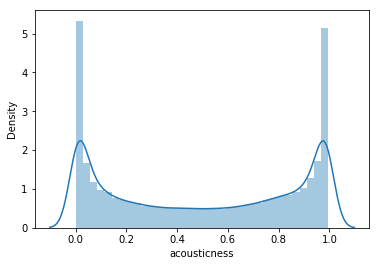

In [69]:
plt.figure(figsize=(6,4))
sns.distplot(df['acousticness'],bins='auto')

In [70]:
df[df['acousticness']==df['acousticness'].max()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
6,0.4060,1921,0.996,['John McCormack'],0.518,159507,0.20300,0,5uNZnElqOS3W4fRmRYPk4T,0.000,0,0.1150,-10.589,1,The Wearing of the Green,4,1921,0.0615,66.221
8,0.7210,1921,0.996,['Ignacio Corsini'],0.485,161520,0.13000,0,05xDjWH9ub67nJJk82yfGf,0.151,5,0.1040,-21.508,0,La Mañanita - Remasterizado,0,1921-03-20,0.0483,64.678
17,0.6640,1921,0.996,"['Hector Berlioz', 'Arturo Toscanini']",0.541,250747,0.28300,0,0POO8XaUgW5Qjbv9sbDy8W,0.898,9,0.3930,-14.808,1,Rákóczy March,0,1921,0.0477,108.986
26,0.6780,1921,0.996,['Maurice Chevalier'],0.500,181733,0.27400,0,0i7MdVu0tNEyUdgpCBilKe,0.000,2,0.3020,-14.001,1,Je M'donne,0,1921,0.0410,79.218
51,0.5580,1921,0.996,['Ignacio Corsini'],0.655,178347,0.11900,0,27LYINFAjaKGMWQc6EfAtT,0.474,11,0.1430,-22.774,1,Mis Harapos - Remasterizado,0,1921-03-20,0.1270,106.511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157724,0.6130,1955,0.996,"['Johann Sebastian Bach', 'Glenn Gould']",0.391,190267,0.27300,0,7GNyTKf0pKToA9FhZuZqf5,0.945,6,0.0875,-15.896,0,"The Well-Tempered Clavier, Book 2, BWV 870-893...",4,1955,0.0374,96.849
158221,0.3910,1958,0.996,['Zeki Müren'],0.414,204434,0.39900,0,1OpzMiz85yQP16yKyMpy0L,0.723,0,0.4370,-6.302,0,Gözlerinin İçine Başka Hayal Girmesin,15,1958-08-11,0.0388,82.392
159504,0.2030,1964,0.996,"['Frédéric Chopin', 'Arthur Rubinstein']",0.290,168173,0.05380,0,5ElFtY6kvyjkv2E2KVfzHB,0.796,1,0.1430,-30.162,1,"3 Waltzes, Op. posth. 70: No. 3 in D-Flat Major",14,1964,0.0500,78.679
162807,0.0589,1981,0.996,['Penguin Cafe Orchestra'],0.203,73667,0.00156,0,3cDjkleibJLC0fobHS9YUo,0.891,2,0.0854,-36.514,1,Harmonic Necklace - 2008 Digital Remaster,26,1981,0.0427,172.476


In [71]:
df[df['acousticness']==df['acousticness'].min()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
18641,0.0000,2015,0.0,"['White Noise Meditation', 'Lullaby Land', 'Wh...",0.000,73887,0.000020,0,67iF3DdebmElASIGoebYt1,0.000,5,0.0000,-15.776,1,Brown Noise - Loopable with No Fade,72,2015-05-26,0.0000,0.000
22399,0.0000,1938,0.0,['Benny Goodman'],0.000,5991,0.000000,0,3IcXTeq9O2dpsSXsDj9naH,0.000,0,0.0000,-60.000,0,Pause Track - Live,0,1938,0.0000,0.000
22464,0.0000,1938,0.0,['Benny Goodman'],0.000,6362,0.000000,0,523qs4UcGlQ6ycdha1VGqs,0.000,0,0.0000,-60.000,0,Pause Track - Live,0,1938,0.0000,0.000
37461,0.0000,2014,0.0,['Sound Library XL'],0.000,109126,0.000819,0,5fD4liUw1zytutz64zFlX7,0.818,7,0.4530,-20.590,1,Sleep Rain,63,2014-12-02,0.0000,0.000
60974,0.0000,1949,0.0,['Future Rapper'],0.000,420000,0.000000,0,0Rd7eiAZGayLT8TmrVpQzG,0.000,0,0.0000,-60.000,0,StaggerLee Has His Day at the Beach,0,1949-02-17,0.0000,0.000
74238,0.0000,2016,0.0,"['Brown Noise for Babies', 'White Noise for De...",0.000,73887,0.000020,0,3qdGhfS5yIyqXMNtmJov6o,0.000,5,0.0000,-15.776,1,Brown Noise,60,2016-04-18,0.0000,0.000
76487,0.0000,1936,0.0,['Apocolothoth'],0.000,84000,0.000020,0,6A4UMC5FcGIsxMaWlHLAIf,0.000,0,0.0000,-20.893,1,Fluoxetin,0,1936-11-15,0.0000,0.000
78141,0.0000,1949,0.0,['Sarah Vaughan'],0.000,5108,0.000000,0,0hr9kRUi2X4MXc72A4VxG4,0.000,0,0.0000,-60.000,0,Pause Track,0,1949,0.0000,0.000
107688,0.0000,2015,0.0,"['Deep Sleep', 'Sleep Baby Sleep', 'Lullabies ...",0.000,71398,0.000020,0,590RGsZ4nakW5zcijKeNdi,0.124,10,0.6880,-17.502,0,Pure Brown Noise - Loopable with no fade,54,2015-01-22,0.0000,0.000
124213,0.0309,2017,0.0,['Rain Sounds Factory STHLM'],0.210,250000,0.153000,0,5VElkYenegHlF1oBmZ06oq,0.996,0,0.4900,-15.128,0,Rain Sound : Monsun,61,2017-04-21,0.0648,64.435


#### danceability

In [72]:
df['danceability'].describe()

count    170653.000000
mean          0.537396
std           0.176138
min           0.000000
25%           0.415000
50%           0.548000
75%           0.668000
max           0.988000
Name: danceability, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


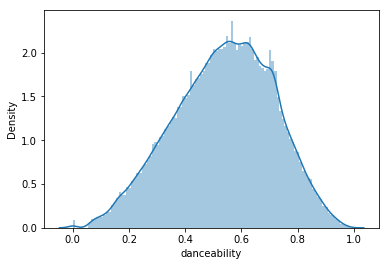

In [73]:
plt.figure(figsize=(6,4))
sns.distplot(df['danceability'],bins='auto')

In [74]:
df[df['danceability']==df['danceability'].min()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
508,0.0,1924,0.99600,['Ignacio Corsini'],0.0,133947,0.025800,0,2WTtJDfCUjAyCZHRSfCLDn,0.76800,5,0.0831,-24.894,1,La Mina del Ford - Remasterizado,0,1924-03-29,0.0,0.0
591,0.0,1924,0.99600,['Francisco Canaro'],0.0,170253,0.315000,0,5tQsQaMquCXBREb1FNymi7,0.95600,8,0.3750,-15.969,0,Oh Mujer Mujer - Remasterizado,0,1924-07-12,0.0,0.0
2578,0.0,1934,0.00244,['The Moors'],0.0,14629,0.801000,0,29IVdlO7CSlcoOIpOsamkO,0.00125,4,0.0503,-0.671,0,Santa Claus Is Coming To Town,0,1934,0.0,0.0
2764,0.0,1935,0.93600,['Orquesta Francisco Canaro'],0.0,211880,0.202000,0,1QXbWUSsLWPtHrbZ7H8o9i,0.01370,6,0.1200,-12.399,1,Tu Y Yo,4,1935-01-01,0.0,0.0
3042,0.0,1937,0.89000,['Billie Holiday'],0.0,159600,0.281000,0,09eDRV4nzC3eVX7tDEJUNb,0.00000,10,0.2470,-13.078,1,Back In Your Own Backyard - Take 1,17,1937,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169591,0.0,2015,0.46900,['$uicideBoy$'],0.0,153809,0.630000,1,00CutyaH2ljgLtM0nM5LLd,0.37500,2,0.1270,-6.707,1,Clouds As Witnesses,52,2015-03-03,0.0,0.0
169717,0.0,2016,0.12700,"['Rain Sounds', 'Rain Sounds & White Noise', '...",0.0,93452,0.000062,0,6HMSnRW8Htfd3YxdNgUF73,0.99900,9,0.7180,-18.685,1,Pouring Rain,54,2016-03-01,0.0,0.0
169935,0.0,2017,0.42000,['Granular'],0.0,180656,0.001720,0,03sJaTenPLeRaVUISW6pI5,0.39900,4,0.1100,-27.848,0,Pink Noise - BP 240 hz,61,2017-11-24,0.0,0.0
169968,0.0,2017,0.96200,['Fabricants'],0.0,175680,0.000020,0,4UYLGTJRGCt4KzP9r9Y9bH,0.02800,11,0.1370,-52.220,0,Brain Relaxation,57,2017-01-18,0.0,0.0


In [75]:
df[df['danceability']>0.95]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
11648,0.728,1980,0.012600,['Steely Dan'],0.952,307400,0.301,0,1tjK9HhmpEfk0ijyIKsoUk,0.000931,2,0.0387,-13.936,1,Hey Nineteen,62,1980,0.0612,119.629
12585,0.552,1984,0.059100,['Run–D.M.C.'],0.964,290280,0.889,0,2J6QnTjHIWwXErNWyF0RUC,0.000000,11,0.1660,-5.169,1,It's Like That,53,1984-03-27,0.1470,121.144
12814,0.961,1986,0.000844,['Run–D.M.C.'],0.956,183427,0.720,0,6jBCehpNMkwFVF3dz4nLIW,0.000000,11,0.0597,-13.476,0,It's Tricky,71,1986-05-15,0.1370,127.872
13489,0.929,1989,0.075500,['Tone-Loc'],0.988,248160,0.633,0,5YIF6HSOtHN9HdcE5IPzMe,0.000002,5,0.0668,-15.012,0,Funky Cold Medina,56,1989-01-01,0.0888,117.493
13515,0.800,1989,0.156000,['UB40'],0.956,228293,0.254,0,3e7yziCpnpx2ujgvXqSLzp,0.036200,8,0.0362,-13.264,1,Kingston Town,49,1989-01-01,0.0551,102.071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170107,0.584,2018,0.212000,['ITSOKTOCRY'],0.985,138715,0.438,1,5N6USyYyAuSyysUQ1xncYc,0.000054,1,0.1160,-11.004,1,"POP, LOCK & DROPDEAD",60,2018-03-18,0.0712,118.079
170159,0.899,2018,0.184000,['Aminé'],0.962,117307,0.563,1,6U9OkV9oa8kN8LyBGf3wvJ,0.000000,2,0.0590,-6.372,1,BLACKJACK,60,2018-08-15,0.2460,131.023
170196,0.525,2018,0.728000,['Vinny West'],0.953,191687,0.374,1,3ZIc9JjtVQadMkew71IhLf,0.000000,4,0.2700,-11.926,0,No Face No Case,58,2018-07-21,0.3900,102.998
170277,0.363,2019,0.002020,['Tory Lanez'],0.966,173926,0.563,1,0NJp8GyCOWnQh71xKSPfuV,0.000000,8,0.1050,-5.764,1,Freaky,63,2019-03-15,0.0618,104.991


#### duration_ms

In [76]:
# in minutes
x = df['duration_ms']/60000
x.describe()

count    170653.000000
mean          3.849139
std           2.101974
min           0.085133
25%           2.830450
50%           3.457783
75%           4.373333
max          90.058333
Name: duration_ms, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


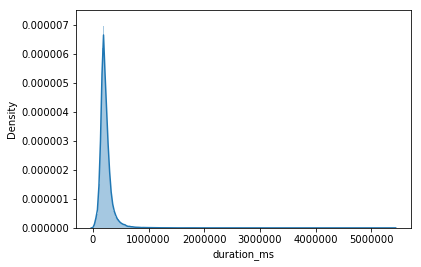

In [77]:
plt.figure(figsize=(6,4))
sns.distplot(df['duration_ms'],bins='auto')

In [78]:
df[df['duration_ms']==df['duration_ms'].min()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
78141,0.0,1949,0.0,['Sarah Vaughan'],0.0,5108,0.0,0,0hr9kRUi2X4MXc72A4VxG4,0.0,0,0.0,-60.0,0,Pause Track,0,1949,0.0,0.0


In [79]:
df[df['duration_ms']==df['duration_ms'].max()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
107341,0.0,2013,0.111,['Sound Dreamer'],0.0,5403500,0.000099,0,7foc25ig7dibxvULPU2kBG,0.392,2,0.137,-21.669,1,Brown Noise - 90 Minutes,50,2013-06-05,0.0,0.0


#### energy

In [80]:
df['energy'].describe()

count    170653.000000
mean          0.482389
std           0.267646
min           0.000000
25%           0.255000
50%           0.471000
75%           0.703000
max           1.000000
Name: energy, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


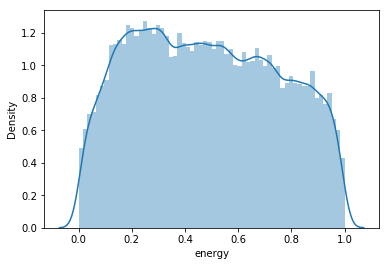

In [81]:
plt.figure(figsize=(6,4))
sns.distplot(df['energy'],bins='auto')

In [82]:
df[df['energy']==df['energy'].max()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
3289,0.00001,1938,0.880,['Benny Goodman'],0.2980,73933,1.0,0,4jmpeJO5XS9MukFzhARGrS,0.889,6,0.403,-19.537,1,Applause; Benny Goodman's 'No Encore' Announce...,7,1938,0.0950,93.226
3309,0.00001,1938,0.835,['Benny Goodman'],0.2640,41093,1.0,0,3RFogvPJRYXVCv9qlotTKK,0.693,11,0.951,-22.887,0,Applause; Transition Back to Goodman Orchestra...,5,1938,0.0722,52.339
22437,0.00001,1938,0.315,['Benny Goodman'],0.3050,26640,1.0,0,4MeVaz1Ki3nEofHif86bAd,0.717,9,0.366,-20.422,0,Applause as Lionel Hampton Enters - Live,0,1938,0.2370,123.257
38326,0.00001,2019,0.902,['Rain Recordings'],0.0771,170000,1.0,0,6ADPydLM8fmi6fjO9ZXAb8,0.613,3,0.845,-16.540,0,Forest Rain,74,2019-09-06,0.0508,171.623
38670,0.00001,1926,0.131,['Maurice Chevalier'],0.1660,190493,1.0,0,2cODstPu4nOAIFfwnvNEwx,0.311,4,0.333,-4.373,0,Moi J'fais Mes Coups En Dessous,0,1926,0.0643,116.707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108673,0.00001,2020,0.994,['Creatress'],0.1680,155625,1.0,0,1TYHz90DiG6VARt4hjopOF,0.680,6,0.913,-18.081,0,Steady Forest Rain,72,2020-08-09,0.0406,86.571
111342,0.00866,1952,0.843,['Unspecified'],0.2470,44227,1.0,0,1bAnpR1iLXqubLZxiT5XWv,0.747,6,0.496,-10.823,1,"1 1/2 Miles Out above Water, Snapping Shrimp, ...",0,1952-01-01,0.0667,116.574
144551,0.00001,1964,0.472,['Walt Disney Sound Effects Group'],0.3350,68920,1.0,0,54qpPBtrNYIu7uzNv5csW1,0.516,6,0.379,-17.067,1,Fuses and Explosions,11,1964-01-01,0.0913,122.873
169639,0.00001,2015,0.358,['Outside Broadcast Recordings'],0.0661,224023,1.0,0,4Xh9F5OQyJjN9Gx7IUiL0n,0.980,10,0.898,-16.847,1,Soggy Afternoon,52,2015-04-07,0.0535,75.146


In [83]:
df[df['energy']==df['energy'].min()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
22399,0.0,1938,0.0,['Benny Goodman'],0.0,5991,0.0,0,3IcXTeq9O2dpsSXsDj9naH,0.0,0,0.0,-60.0,0,Pause Track - Live,0,1938,0.0,0.0
22464,0.0,1938,0.0,['Benny Goodman'],0.0,6362,0.0,0,523qs4UcGlQ6ycdha1VGqs,0.0,0,0.0,-60.0,0,Pause Track - Live,0,1938,0.0,0.0
60974,0.0,1949,0.0,['Future Rapper'],0.0,420000,0.0,0,0Rd7eiAZGayLT8TmrVpQzG,0.0,0,0.0,-60.0,0,StaggerLee Has His Day at the Beach,0,1949-02-17,0.0,0.0
78141,0.0,1949,0.0,['Sarah Vaughan'],0.0,5108,0.0,0,0hr9kRUi2X4MXc72A4VxG4,0.0,0,0.0,-60.0,0,Pause Track,0,1949,0.0,0.0
128901,0.0,1960,0.0,['Connie Francis'],0.0,179466,0.0,0,0zr7DJGTPUfAUmjM7crmt2,0.0,0,0.0,-60.0,0,Hava Nagilah,12,1960-01-01,0.0,0.0
142097,0.0,1949,0.0,['Sarah Vaughan'],0.0,6467,0.0,0,3lRVIn6D6EUbvkOgPZAU1H,0.0,0,0.0,-60.0,0,Pause Track,0,1949,0.0,0.0
152961,0.0,2007,0.0,['Atlas Fret'],0.0,132827,0.0,0,7cctPQS83y620UQtMd1ilL,0.0,0,0.0,-60.0,0,(silent track),41,2007-01-01,0.0,0.0
166250,0.0,1998,0.0,['Robert Earl Keen'],0.0,60372,0.0,0,0o12mLSQuXFgsh4e2Kc4e5,0.0,0,0.0,-60.0,0,Silent Track,32,1998-10-27,0.0,0.0
166988,0.0,2002,0.0,['Boards of Canada'],0.0,106480,0.0,0,10fcilqlC68N33eWF3rHa1,0.0,0,0.0,-60.0,0,Magic Window,37,2002-02-19,0.0,0.0


#### explicit

In [84]:
df['explicit'].describe()

count    170653.000000
mean          0.084575
std           0.278249
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: explicit, dtype: float64

Ratio Clean : 0.9154248680070084
Ratio Explicit : 0.08457513199299163
Number Songs : 170653


/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


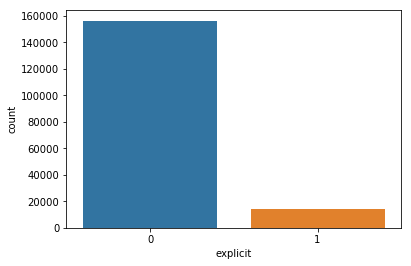

In [85]:
plt.figure(figsize=(6,4))
x = df['explicit']
sns.countplot(x, label='count')
C,R = x.value_counts()
print('Ratio Clean :', C/x.shape[0])
print('Ratio Explicit :', R/x.shape[0])
print('Number Songs :', x.shape[0])

In [86]:
df[df['explicit']==1]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
14,0.4930,1921,0.01750,['Zay Gatsby'],0.527,205072,0.691,1,0MJZ4hh60zwsYleWWxT5yW,0.384000,7,0.3580,-7.298,1,Power Is Power,0,1921-03-27,0.0326,159.935
18,0.0778,1921,0.14800,['THE GUY'],0.604,204957,0.418,1,0QQmUf4aPFaN9U2yRko595,0.038200,4,0.1020,-11.566,0,When We Die,0,1921-09-11,0.0417,80.073
40,0.5440,1921,0.18500,['THE GUY'],0.577,404062,0.422,1,1T2NGVgAoXjQPEjxTGFRZV,0.034900,1,0.1780,-11.108,1,Love for Guns,0,1921-09-11,0.0575,79.997
88,0.0779,1921,0.58800,['THE GUY'],0.341,323840,0.256,1,3YVy92W44JmU6KeF6UMldm,0.157000,9,0.1050,-16.012,1,Tigers,0,1921-09-11,0.0461,121.051
99,0.4060,1921,0.44700,['THE GUY'],0.708,279171,0.544,1,4SU8RBlxrOtlHjkUxkpDCY,0.037500,0,0.0733,-8.124,1,Don't Run,0,1921-09-11,0.0316,120.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170639,0.5220,2020,0.00861,['Pooh Shiesty'],0.819,177110,0.651,1,7w77k7yCaDOMe25fYxnzit,0.000000,10,0.3780,-5.859,0,7.62 God,62,2020-07-03,0.2910,77.013
170643,0.9070,2020,0.00952,"['DJ Scheme', 'Cordae', 'Ski Mask The Slump Go...",0.917,228333,0.569,1,3C9D1X8NkG2Ak1RaGpRnnQ,0.000000,7,0.0774,-10.456,1,Soda (feat. Take A Daytrip),66,2020-11-13,0.2790,144.014
170646,0.5220,2020,0.20400,['Gunna'],0.598,230600,0.472,1,2f8y4CuG57UJEmkG3ujd0D,0.000015,0,0.1080,-10.991,1,NASTY GIRL / ON CAMERA,66,2020-05-22,0.2580,120.080
170651,0.1950,2020,0.00998,['Eminem'],0.671,337147,0.623,1,5SiZJoLXp3WOl3J4C8IK0d,0.000008,2,0.6430,-7.161,1,Darkness,70,2020-01-17,0.3080,75.055


#### instrumentalness

In [87]:
df['instrumentalness'].describe()

count    170653.000000
mean          0.167010
std           0.313475
min           0.000000
25%           0.000000
50%           0.000216
75%           0.102000
max           1.000000
Name: instrumentalness, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


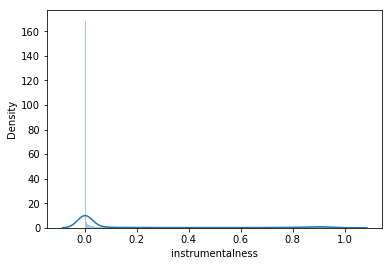

In [88]:
plt.figure(figsize=(6,4))
sns.distplot(df['instrumentalness'],bins='auto')

In [89]:
df[df['instrumentalness']==df['instrumentalness'].min()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
1,0.963,1921,0.73200,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.0,7,0.1600,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
6,0.406,1921,0.99600,['John McCormack'],0.518,159507,0.203,0,5uNZnElqOS3W4fRmRYPk4T,0.0,0,0.1150,-10.589,1,The Wearing of the Green,4,1921,0.0615,66.221
9,0.771,1921,0.98200,['Fortugé'],0.684,196560,0.257,0,08zfJvRLp7pjAb94MA9JmF,0.0,8,0.5040,-16.415,1,Il Etait Syndiqué,0,1921,0.3990,109.378
10,0.826,1921,0.99500,['Maurice Chevalier'],0.463,147133,0.260,0,0BMkRpQtDoKjcgzCpnqLNa,0.0,9,0.2580,-16.894,1,Dans La Vie Faut Pas S'en Faire,0,1921,0.0557,85.146
12,0.493,1921,0.99000,['Georgel'],0.315,190800,0.363,0,0H3k2CvJvHULnWChlbeFgx,0.0,5,0.2920,-12.562,0,La Vipère,0,1921,0.0546,174.532
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170636,0.394,2020,0.20100,"['Myke Towers', 'Maluma', 'Farruko']",0.775,250333,0.633,1,70zg99pT51vB4wlMS7e4q7,0.0,10,0.2190,-3.332,0,La Playa - Remix,74,2020-01-03,0.1330,140.008
170639,0.522,2020,0.00861,['Pooh Shiesty'],0.819,177110,0.651,1,7w77k7yCaDOMe25fYxnzit,0.0,10,0.3780,-5.859,0,7.62 God,62,2020-07-03,0.2910,77.013
170641,0.187,2020,0.57400,['Bazzi'],0.445,176250,0.330,0,0PUkanqCGTb6qseXPKOw1F,0.0,9,0.1020,-8.121,1,I Don't Think I'm Okay,69,2020-07-09,0.0429,128.025
170643,0.907,2020,0.00952,"['DJ Scheme', 'Cordae', 'Ski Mask The Slump Go...",0.917,228333,0.569,1,3C9D1X8NkG2Ak1RaGpRnnQ,0.0,7,0.0774,-10.456,1,Soda (feat. Take A Daytrip),66,2020-11-13,0.2790,144.014


In [90]:
df[df['instrumentalness']==df['instrumentalness'].max()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
19030,0.000000,2017,0.791000,"['Erik Eriksson', 'White Noise Baby Sleep', 'W...",0.0000,90228,0.00342,0,2bRKxuH1o7pTmb1y4GfdEc,1.0,8,0.1110,-28.460,1,Clean White Noise - Loopable with no fade,85,2017-01-08,0.000,0.000
19260,0.000000,2018,0.394000,['High Altitude Samples'],0.0000,160003,0.00148,0,129ldjjvnFfA7Ygc8ktYnh,1.0,5,0.1110,-31.839,1,Soft Brown Noise,81,2018-11-15,0.000,0.000
56544,0.000000,2016,0.001190,['The White Noise Zen & Meditation Sound Lab'],0.0000,148000,0.34200,0,5X8Hut4pmjxDUd8bYfFqjb,1.0,9,0.3920,-14.959,0,Calm Rain Storm & Gentle White Noise,64,2016-02-11,0.000,0.000
56682,0.000000,2017,0.908000,"['Erik Eriksson', 'White Noise for Babies', 'W...",0.0000,72223,0.00125,0,5I21rMWLtCjWQl6QyLn85W,1.0,1,0.1110,-27.592,1,Pure Brown Noise - Loopable with no fade,72,2017-01-08,0.000,0.000
56932,0.021200,2018,0.957000,['High Altitude Samples'],0.0559,171719,0.33800,0,0KByxc2bldSo9PtAQQnipz,1.0,10,0.1120,-31.434,0,Cabin Back Noise,70,2018-11-15,0.104,58.227
74372,0.000000,2016,0.791000,"['Erik Eriksson', 'Lullabies for Deep Meditati...",0.0000,90228,0.00342,0,4MaJMSbaMBW3IrBuvWlOSX,1.0,8,0.1110,-28.460,1,White Noise - Loopable With No Fade,60,2016-12-04,0.000,0.000
108090,0.000000,2017,0.106000,['Rain Sounds ACE'],0.0000,164452,0.65400,0,5aVTpbRU7DM9GfCNydb9MR,1.0,3,0.8590,-14.770,0,Rain in the Park,63,2017-05-05,0.000,0.000
108109,0.000000,2017,0.872000,['Granular'],0.0000,104516,0.00002,0,2eWqBNH136U8Et0UTxBacB,1.0,1,0.0954,-27.194,1,White Noise - BP 228 hz,64,2017-10-14,0.000,0.000
138618,0.000537,2009,0.975000,['Sounds for Life'],0.1530,4270034,0.07920,0,605JTCltCe1IcqrGXQ294K,1.0,10,0.1130,-23.962,0,Brown Noise for Sleep,42,2009-03-15,0.125,132.904
154831,0.000000,2017,0.000059,['Relaxation Channel'],0.0000,60043,0.00002,0,1cDoexqoPljd8ztMW7dLCe,1.0,1,0.7340,-15.457,1,Pink Noise (Loopable),55,2017-10-19,0.000,0.000


#### key

In [91]:
(df['key'].value_counts()/df.shape[0]).sort_index()

0     0.126573
1     0.075510
2     0.110300
3     0.042759
4     0.075785
5     0.096277
6     0.051221
7     0.121902
8     0.062999
9     0.102963
10    0.071185
11    0.062525
Name: key, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


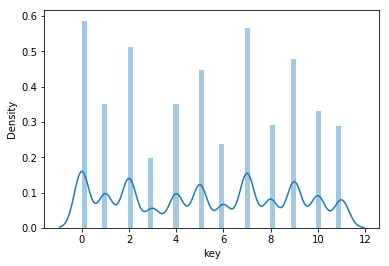

In [92]:
plt.figure(figsize=(6,4))
sns.distplot(df['key'],bins='auto')

#### liveness

In [93]:
df['liveness'].describe()

count    170653.000000
mean          0.205839
std           0.174805
min           0.000000
25%           0.098800
50%           0.136000
75%           0.261000
max           1.000000
Name: liveness, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


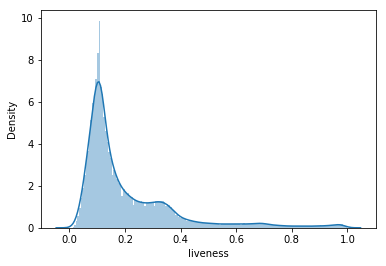

In [94]:
plt.figure(figsize=(6,4))
sns.distplot(df['liveness'],bins='auto')

In [95]:
df[df['liveness'] > df['liveness'].max() - df['liveness'].std()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
161,0.75300,1922,0.985,['Ignacio Corsini'],0.370,153533,0.372,0,0l3BQsVJ7F76wlN5QhJzaP,0.000681,2,0.929,-17.138,1,El Vendaval - Remasterizado,0,1922-03-21,0.0865,159.669
186,0.65900,1922,0.990,['Ignacio Corsini'],0.543,130987,0.424,0,2UU5t5j325ofKGcg7oUQNh,0.037900,5,0.861,-18.425,1,Sin Amor - Remasterizado,0,1922-03-21,0.2690,68.567
209,0.52800,1922,0.980,['Ignacio Corsini'],0.422,179813,0.561,0,5wfVO3v2ZiWmQvJuRgJANe,0.000003,5,0.966,-18.573,0,Monigote - Remasterizado,0,1922-03-21,0.4610,121.542
272,0.51400,1923,0.971,['Louis Armstrong & His Hot Five'],0.561,197067,0.353,0,4m1Th0JSQkevDsHiOpoxlQ,0.130000,10,0.922,-9.617,1,Basin Street Blues - rec. 1928,6,1923,0.0538,107.711
397,0.76500,1923,0.993,['Fortugé'],0.687,187933,0.173,0,71tnorDlCFZ4g2c1VEaQkR,0.000000,5,0.860,-14.726,1,C'est Jeune Et Ca N'sait Pas,0,1923,0.0772,114.198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169919,0.00716,2017,0.845,['Waterfall Sounds'],0.215,63478,0.994,0,2XXLM6Gp4szTdEO4yaMxwZ,0.990000,8,0.987,-22.288,1,Waterfall Sounds,57,2017-01-22,0.0649,69.152
169924,0.00271,2017,0.168,['Decidic FX'],0.061,279650,0.997,0,5izkpKVqd3GcRkYFBm9WOn,0.988000,10,0.905,-20.579,1,Breeze Rain,60,2017-05-05,0.0747,70.067
169944,0.00001,2017,0.671,['Waves Hard'],0.166,154181,1.000,0,1kBCDfKuTlsLERXOBcmzWv,0.919000,5,0.977,-19.012,1,Ocean For Sleep,57,2017-05-06,0.0550,113.189
170131,0.24600,2018,0.892,['Tyler Childers'],0.444,319853,0.210,0,2JaIIUKcFXkgMRL3v3mZEK,0.000021,3,0.839,-13.500,1,Bottles and Bibles (Live),56,2018-06-29,0.0352,140.939


#### loudness

In [96]:
df['loudness'].describe()

count    170653.000000
mean        -11.467990
std           5.697943
min         -60.000000
25%         -14.615000
50%         -10.580000
75%          -7.183000
max           3.855000
Name: loudness, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


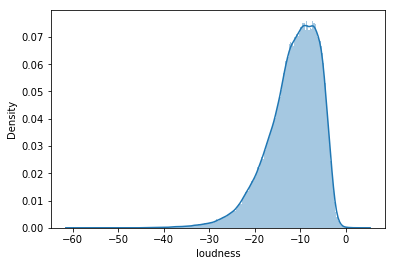

In [97]:
plt.figure(figsize=(6,4))
sns.distplot(df['loudness'],bins='auto')

In [1]:
df[df['loudness'] == df['loudness'].max()-df['loudness'].std()]

NameError: name 'df' is not defined

#### mode

In [99]:
df['mode'].describe()

count    170653.000000
mean          0.706902
std           0.455184
min           0.000000
25%           0.000000
50%           1.000000
75%           1.000000
max           1.000000
Name: mode, dtype: float64

Ratio Major : 0.7069023105365859
Ratio Minor : 0.2930976894634141
Number Songs : 170653


/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


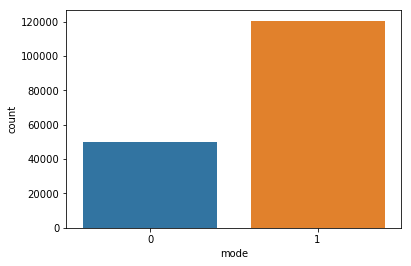

In [100]:
plt.figure(figsize=(6,4))
x = df['mode']
sns.countplot(x, label='count')
C,R = x.value_counts()
print('Ratio Major :', C/x.shape[0])
print('Ratio Minor :', R/x.shape[0])
print('Number Songs :', x.shape[0])

#### popularity

In [101]:
df['popularity'].describe()

count    170653.000000
mean         31.431794
std          21.826615
min           0.000000
25%          11.000000
50%          33.000000
75%          48.000000
max         100.000000
Name: popularity, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


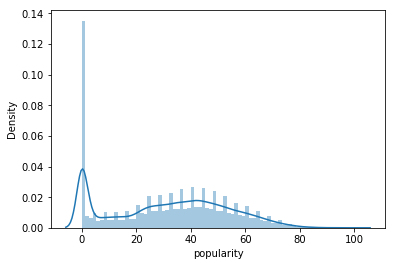

In [102]:
plt.figure(figsize=(6,4))
sns.distplot(df['popularity'],bins='auto')

In [103]:
df[df['popularity'] > df['popularity'].max() - df['popularity'].std()/2]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
19406,0.641,2019,0.5980,['Clairo'],0.744,188387,0.619,0,7B3z0ySL9Rr0XvZEAjWZzM,0.003720,0,0.2310,-9.805,1,Sofia,90,2019-08-02,0.0390,112.997
19407,0.557,2019,0.1220,['Harry Styles'],0.548,174000,0.816,0,6UelLqGlWMcVH1E5c4H7lY,0.000000,0,0.3350,-4.209,1,Watermelon Sugar,94,2019-12-13,0.0465,95.390
19413,0.446,2019,0.7510,['Lewis Capaldi'],0.501,182161,0.405,0,7qEHsqek33rTcFNT9PFqLf,0.000000,1,0.1050,-5.679,1,Someone You Loved,91,2019-05-17,0.0319,109.891
19426,0.664,2019,0.2230,"['Topic', 'A7S']",0.789,166794,0.720,0,3H7ihDc1dqLriiWXwsc2po,0.000000,8,0.1290,-5.652,0,Breaking Me,92,2019-12-19,0.2180,122.031
19606,0.756,2020,0.2210,"['24kGoldn', 'iann dior']",0.700,140526,0.722,1,3tjFYV6RSFtuktYl3ZtYcq,0.000000,7,0.2720,-3.558,0,Mood (feat. iann dior),99,2020-07-24,0.0369,90.989
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38572,0.791,2020,0.3100,"['Wisin', 'Myke Towers', 'Los Legendarios']",0.823,213314,0.821,0,2bgcUk2A3jjKbCJ7KPquTi,0.000004,8,0.1430,-3.402,0,Mi Niña,90,2020-09-23,0.1660,99.999
57207,0.950,2020,0.1670,['Camilo'],0.824,187427,0.457,0,73nAK3HgQK8dak83Y2WQ8F,0.000000,6,0.0410,-5.428,1,Vida de Rico,92,2020-09-21,0.0543,87.977
57244,0.884,2020,0.4220,"['Maluma', 'Lenny Tavárez', 'Justin Quiles']",0.691,248345,0.739,0,4RJz8NfIe09gpKMiRUWKhJ,0.000004,5,0.1100,-3.090,0,Parce (feat. Justin Quiles),91,2020-08-21,0.2290,83.897
57326,0.698,2020,0.0413,"['Rauw Alejandro', 'Camilo']",0.848,222680,0.637,0,4ZRrLHqzhGRXYj2qcB4s5S,0.000000,9,0.0521,-5.132,1,Tattoo - Remix with Camilo,90,2020-07-09,0.1560,96.988


#### speechiness

In [104]:
df['speechiness'].describe()

count    170653.000000
mean          0.098393
std           0.162740
min           0.000000
25%           0.034900
50%           0.045000
75%           0.075600
max           0.970000
Name: speechiness, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


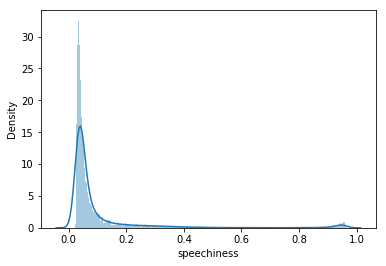

In [105]:
plt.figure(figsize=(6,4))
sns.distplot(df['speechiness'],bins='auto')

In [106]:
df[df['speechiness'] > 0.95]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
983,0.285,1926,0.2630,['Эрнест Хемингуэй'],0.618,98200,0.310,1,06C1qyU9LisOkexJJc5X4L,0.000000,1,0.4140,-14.464,1,Часть 53.2 - Фиеста,0,1926,0.961,184.235
997,0.385,1926,0.0977,['Эрнест Хемингуэй'],0.681,103000,0.304,1,0E34NDoA5tFsksVokrmFo1,0.000000,9,0.1400,-15.338,1,Часть 81.3 - Фиеста,0,1926,0.954,83.944
999,0.362,1926,0.0636,['Эрнест Хемингуэй'],0.696,96900,0.332,1,0EcPKCPdW2WdoUF1p5ubXa,0.000000,0,0.2590,-19.631,1,Часть 54.4 - Фиеста,0,1926,0.951,136.425
1000,0.284,1926,0.3960,"['Georgette Heyer', 'Irina Salkow']",0.639,120465,0.118,0,0EgzqM2yupwQJmKUdlymdP,0.000000,4,0.1340,-20.979,0,Kapitel 26 - Der Page und die Herzogin,2,1926,0.960,164.293
1003,0.370,1926,0.3170,"['Georgette Heyer', 'Irina Salkow']",0.704,114744,0.174,0,0H52HDdiv6rwvOEuRFcIBr,0.000000,6,0.2260,-22.358,0,Kapitel 53 - Der Page und die Herzogin,2,1926,0.951,81.510
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157336,0.358,1953,0.8540,"['Igor Stravinsky', 'Jean Cocteau']",0.788,54747,0.279,0,2Sm5LahOp4H51EqKMPySsX,0.000000,0,0.0948,-19.816,1,Oedipus Rex - Opera-Oratorio in two acts after...,0,1953,0.956,79.715
159371,0.633,1964,0.9530,['Bill Cosby'],0.563,187067,0.468,0,0ANcLLrYD52oCRIRDbvAKj,0.000000,3,0.7380,-15.112,1,The Lone Ranger,11,1964,0.952,149.453
159952,0.442,1966,0.6830,['Dr. Seuss'],0.619,768280,0.291,0,2TJLKoQaiOreB0a67hOOMe,0.000000,0,0.1620,-14.983,1,If I Ran the Zoo,14,1966,0.953,80.254
161594,0.319,1975,0.7920,['Richard Pryor'],0.420,113267,0.775,1,4DRrceRpu1iNfF8NmAEqdO,0.000003,2,0.9730,-13.291,1,Exorcist - Remastered Version,21,1975,0.955,81.993


In [107]:
df[df['speechiness'] < 0.05]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.9820,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.21100,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.6650,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
2,0.0394,1921,0.9610,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.16600,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.1010,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.9670,['Frank Parker'],0.275,210000,0.30900,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.3810,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.9570,['Phil Regan'],0.418,166693,0.19300,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.2290,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665
7,0.0731,1921,0.9930,['Sergei Rachmaninoff'],0.389,218773,0.08800,0,02GDntOXexBFUvSgaXLPkd,0.527000,1,0.3630,-21.091,0,"Morceaux de fantaisie, Op. 3: No. 2, Prélude i...",2,1921,0.0456,92.867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170640,0.6940,2020,0.0699,"['Loud Luxury', 'Frank Walker', 'Stephen Puth']",0.759,176389,0.84500,0,5seWZTjT0U8a7cy3Y5NJQ9,0.000087,6,0.2150,-6.794,0,Like Gold,69,2020-10-30,0.0421,124.000
170641,0.1870,2020,0.5740,['Bazzi'],0.445,176250,0.33000,0,0PUkanqCGTb6qseXPKOw1F,0.000000,9,0.1020,-8.121,1,I Don't Think I'm Okay,69,2020-07-09,0.0429,128.025
170644,0.4660,2020,0.3100,['Fleet Foxes'],0.562,253613,0.68600,0,308prODCCD0O660tIktbUi,0.022500,7,0.1250,-8.480,1,Sunblind,66,2020-09-22,0.0249,103.054
170645,0.1690,2020,0.9940,['Ólafur Arnalds'],0.281,190500,0.03330,0,13MOQ6oQqkrZEDkZOHukCw,0.959000,6,0.0995,-31.460,1,We Contain Multitudes (from home),70,2020-08-26,0.0348,90.250


#### tempo

In [108]:
df['tempo'].describe()

count    170653.000000
mean        116.861590
std          30.708533
min           0.000000
25%          93.421000
50%         114.729000
75%         135.537000
max         243.507000
Name: tempo, dtype: float64

/Users/maxsporer/opt/anaconda3/envs/eco416/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


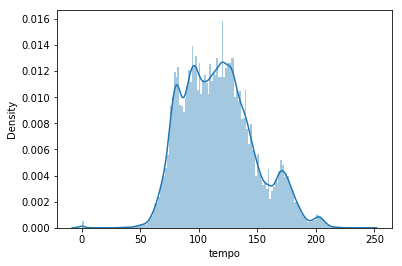

In [109]:
plt.figure(figsize=(6,4))
sns.distplot(df['tempo'],bins='auto')

#### Distributions of Features

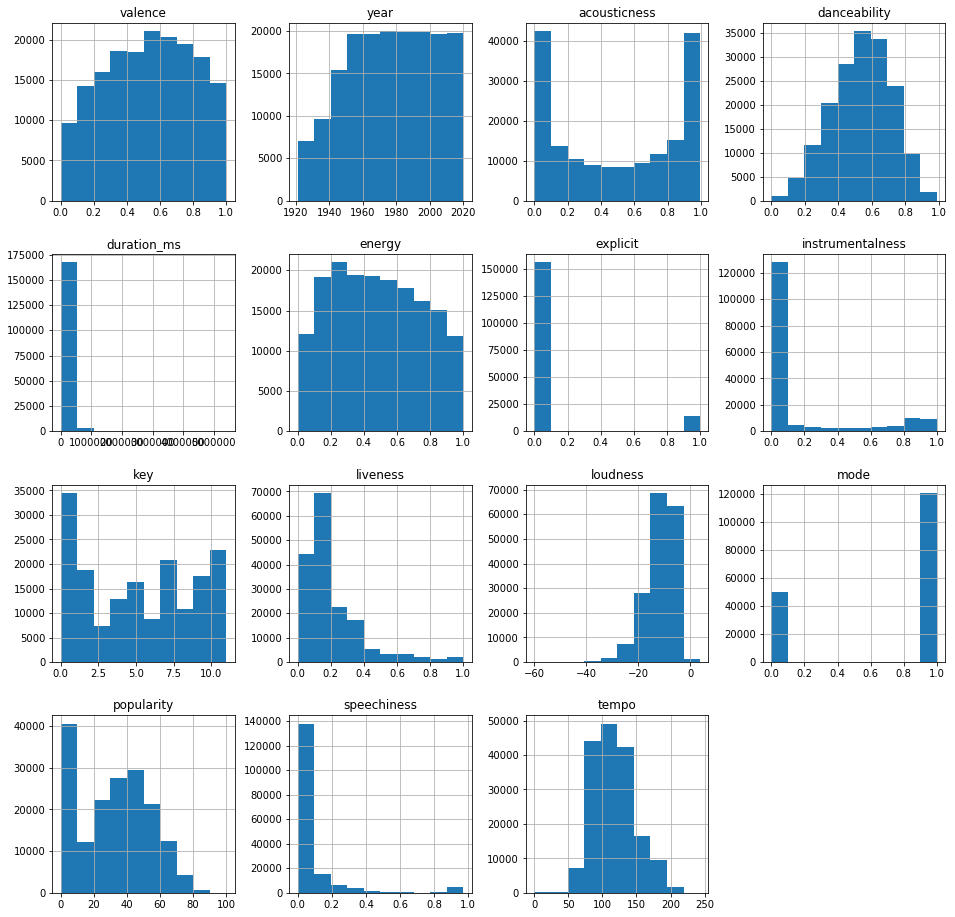

In [110]:
df_num = df.drop(columns=['artists','id','name','release_date'])
df_num.hist(figsize=(16,16))
plt.show()

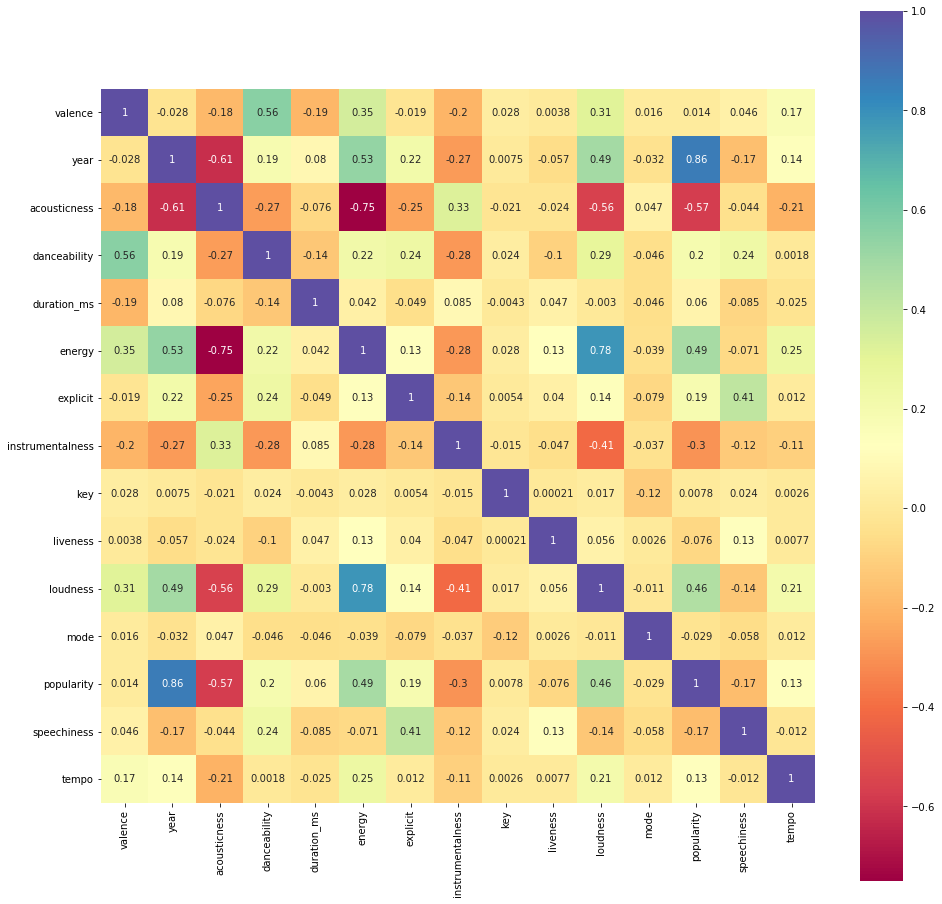

In [111]:
plt.figure(figsize=(16,16))
sns.heatmap(df_num.corr(),annot=True,square=True,cmap='Spectral')
plt.show()

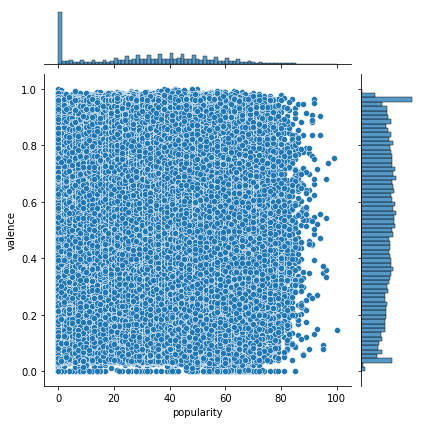

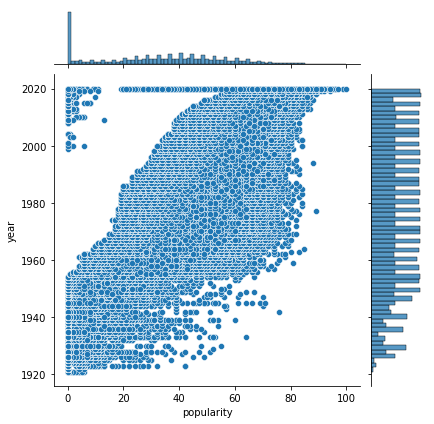

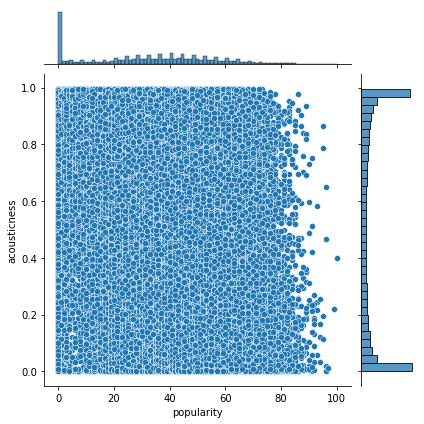

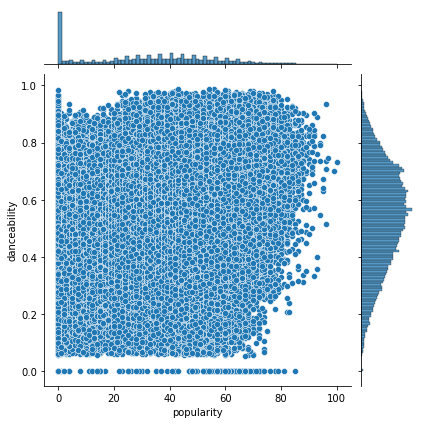

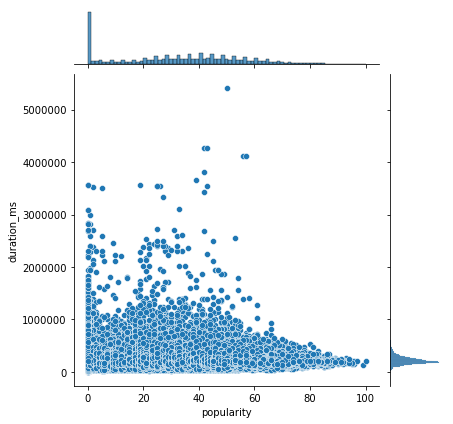

...

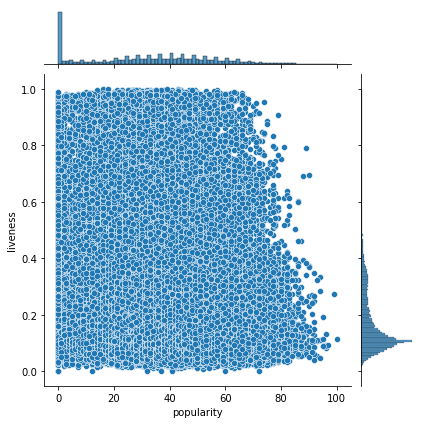

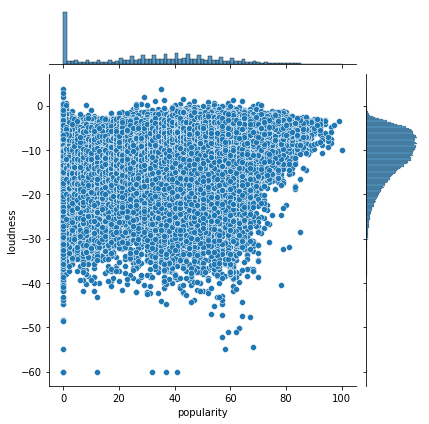

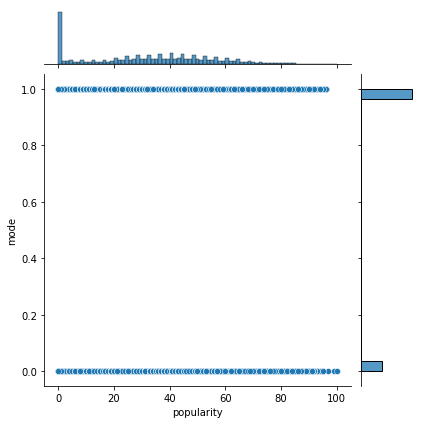

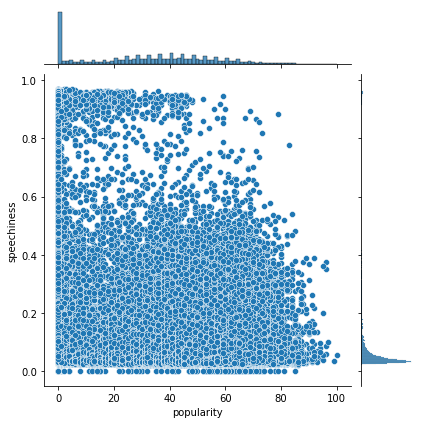

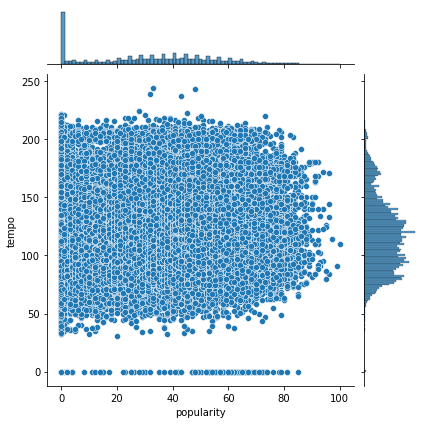

In [112]:
cols = df_num.drop(columns=['popularity']).columns.tolist()
n_cols = len(cols)
for i in range(n_cols):
    sns.jointplot(x=df_num['popularity'],y=df_num[cols[i]],data=df_num)
    plt.show()

#### Trends of Musical Features over Years

In [113]:
df.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [132]:
def plot_mean_over_years(cols):
    plt.figure(figsize=(20,10))

    for col in cols:
        df_temp = df.groupby('year')[col].mean().reset_index()
        ax = sns.lineplot(x=df_temp['year'],y=df_temp[col],label=col)

    ax.set_title('Musical Features Over Years')
    ax.set_ylabel('Feature Value')
    ax.set_xlabel('Year')
    plt.show()
    
def plot_std_over_years(cols):
    plt.figure(figsize=(20,10))

    for col in cols:
        df_temp = df.groupby('year')[col].std().reset_index()
        ax = sns.lineplot(x=df_temp['year'],y=df_temp[col],label=col)

    ax.set_title('Musical Features Over Years')
    ax.set_ylabel('Feature Standard Deviation')
    ax.set_xlabel('Year')
    plt.show()

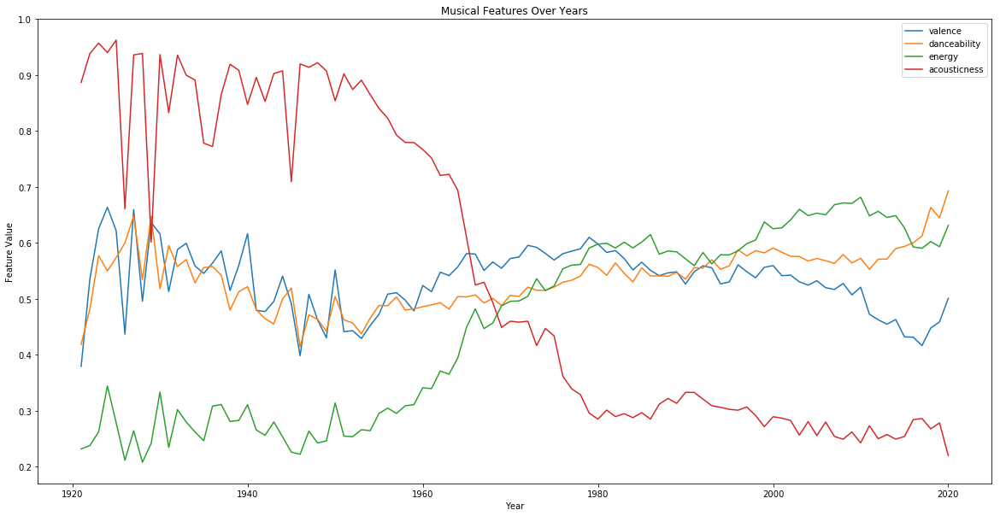

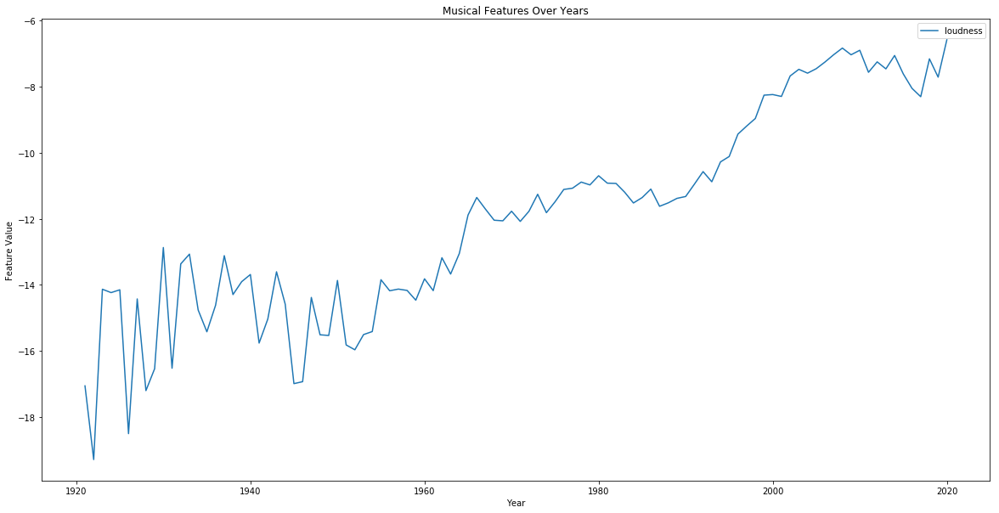

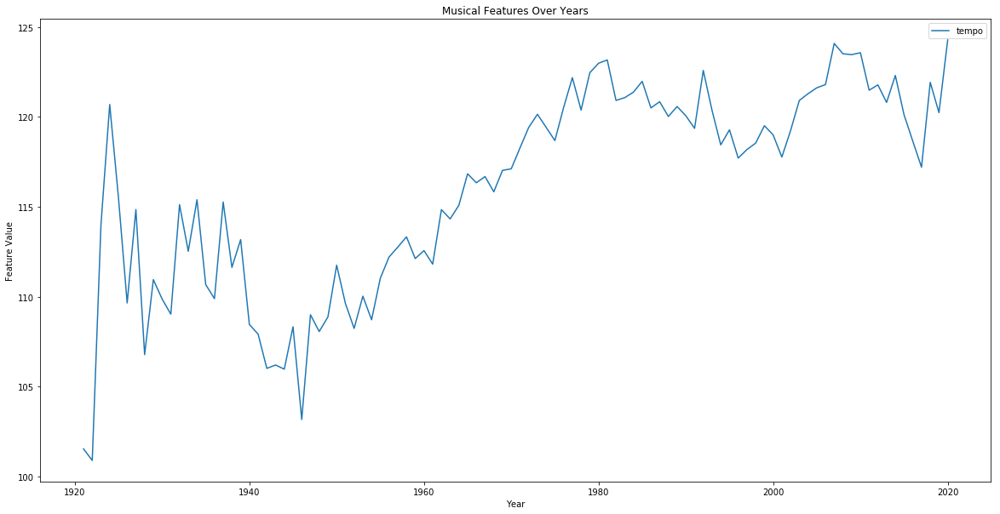

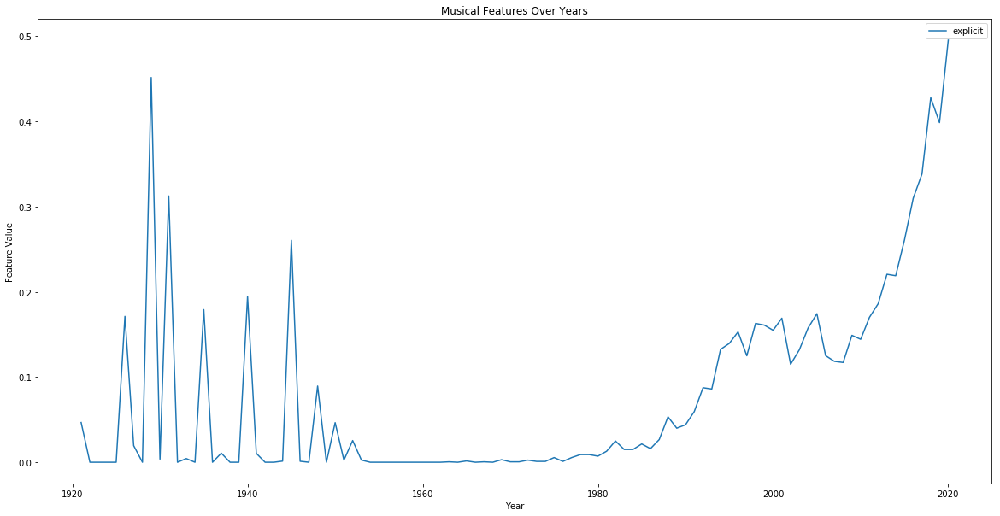

In [139]:
cols = ['valence','danceability','energy','acousticness']
plot_mean_over_years(cols)
plot_mean_over_years(['loudness'])
plot_mean_over_years(['tempo'])
plot_mean_over_years(['explicit'])
#plot_std_over_years(cols)

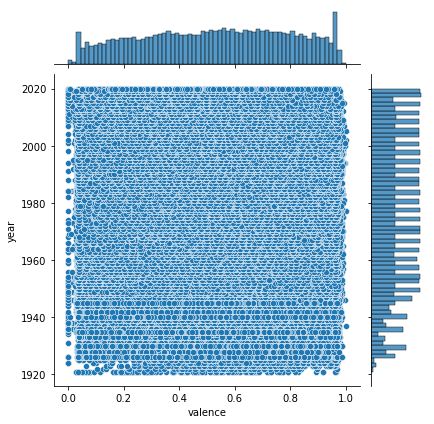

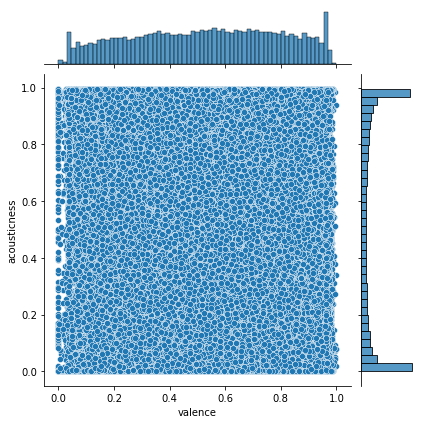

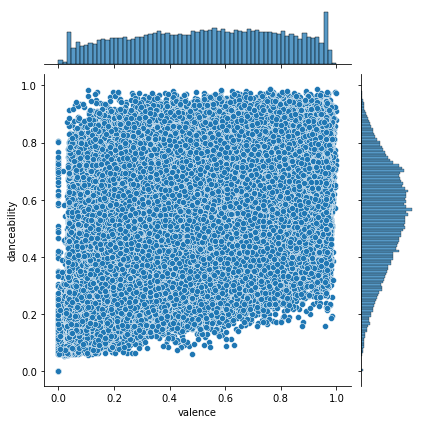

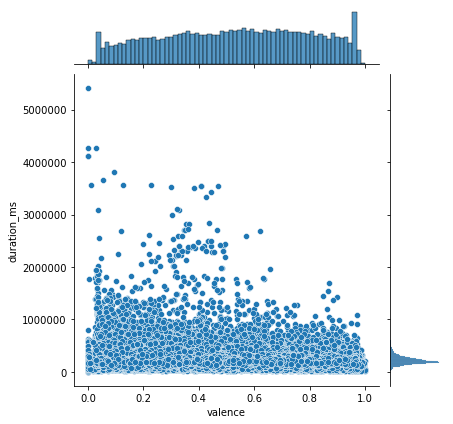

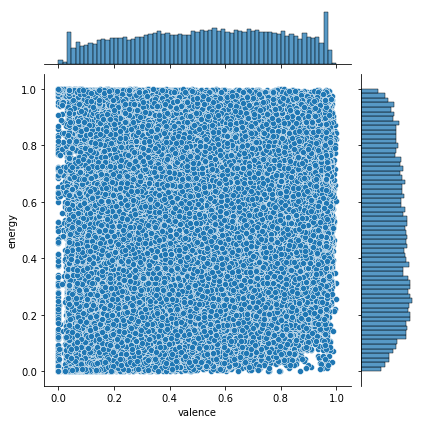

...

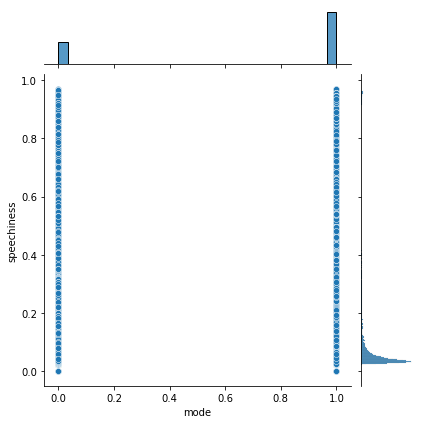

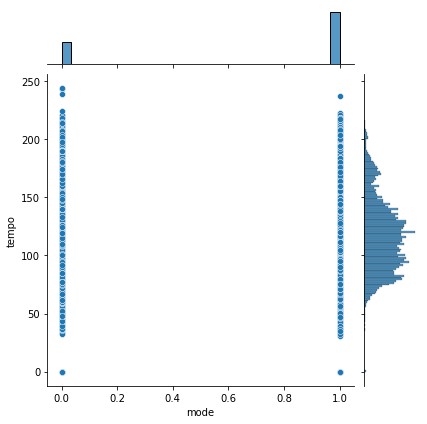

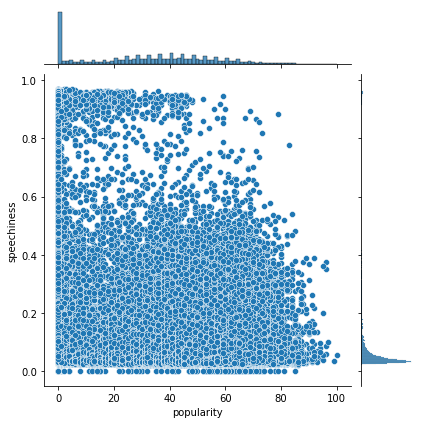

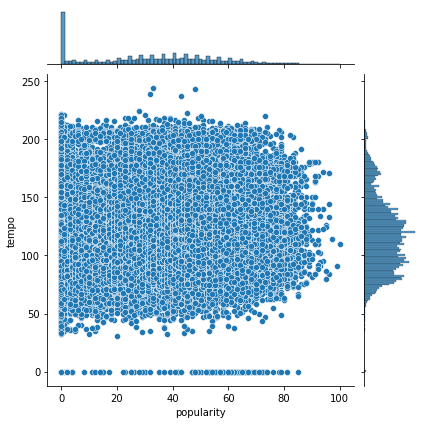

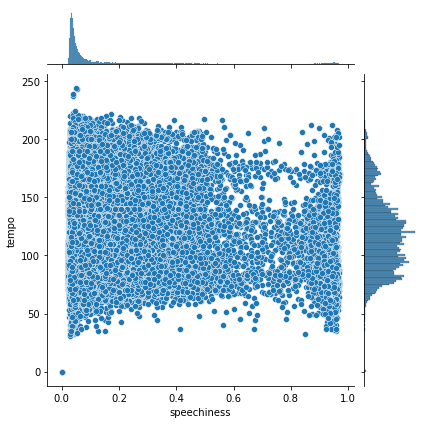

In [22]:
cols = df_num.columns.tolist()
n_cols = len(cols)
for i in range(n_cols):
    j = i+1
    while (j<n_cols):
        sns.jointplot(x=df_num[cols[i]],y=df_num[cols[j]],data=df_num)
        plt.show()
        j+=1

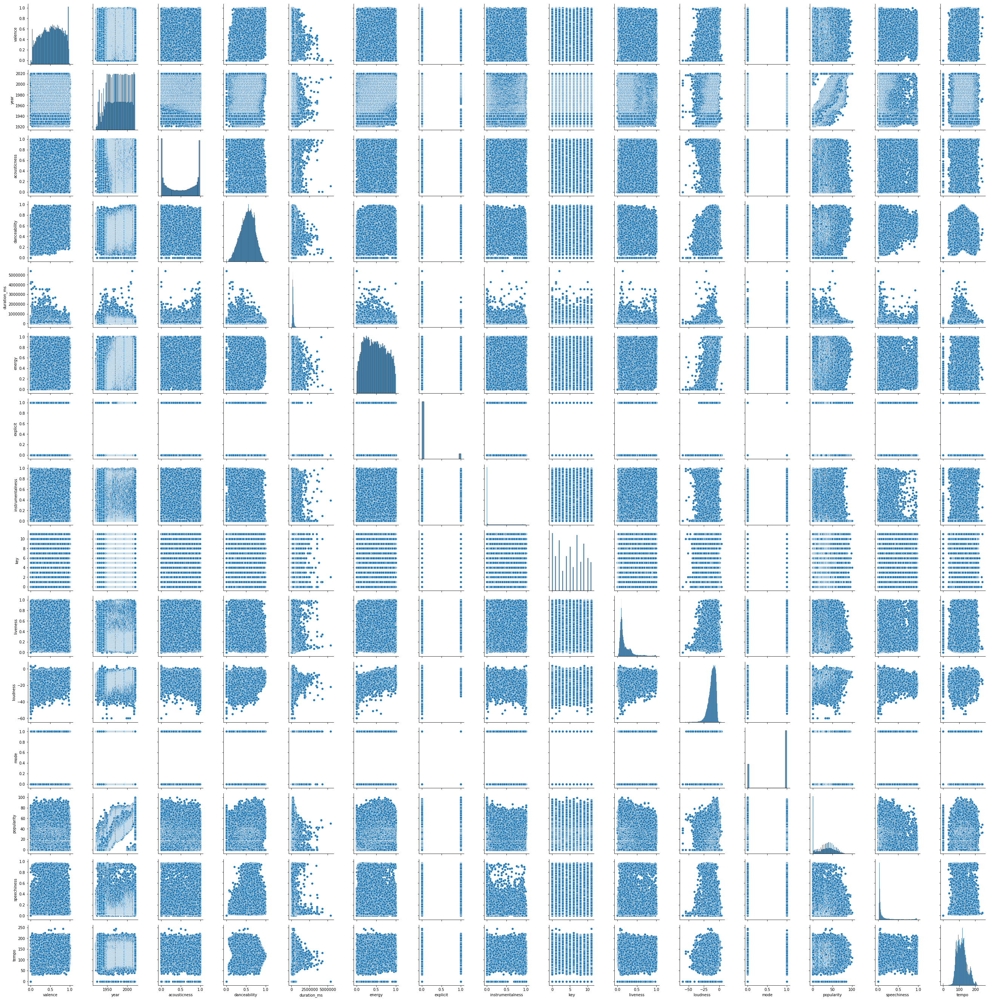

In [23]:
sns.pairplot(df_num)

### OLS Regression (StatsModels)

In [259]:
import statsmodels.api as sm

X = sm.add_constant(df_num.drop(columns=['popularity']))
y = df_num['popularity']

OLS = sm.OLS(y,X)
est = OLS.fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             popularity   R-squared:                       0.754
Model:                            OLS   Adj. R-squared:                  0.754
Method:                 Least Squares   F-statistic:                 3.727e+04
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        19:04:37   Log-Likelihood:            -6.4878e+05
No. Observations:              170653   AIC:                         1.298e+06
Df Residuals:                  170638   BIC:                         1.298e+06
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -1285.6214      2.906   -442.381      0.000   -1291.317   -1279.925
valence              0.6375      0.143      4.470      0.000       0.358       0.917
year                 0.6679      0.001    458.574      0.000       0.665       0.671
acousticness        -4.1406      0.122    -34.043      0.000      -4.379      -3.902
danceability         2.6314      0.209     12.598      0.000       2.222       3.041
duration_ms      -3.507e-07   2.16e-07     -1.625      0.104   -7.74e-07    7.23e-08
energy              -1.5740      0.218     -7.216      0.000      -2.002      -1.146
explicit             0.9244      0.112      8.268      0.000       0.705       1.144
instrumentalness    -4.1789      0.098    -42.850      0.000      -4.370      -3.988
key                  0.0002      0.008      0.026      0.979      -0.015       0.015
liveness            -2.9792      0.157    -18.941      0.000      -3.287      -2.671
loudness             0.0130      0.008      1.577      0.115      -0.003       0.029
mode                -0.2093      0.059     -3.576      0.000      -0.324      -0.095
speechiness         -7.7300      0.200    -38.599      0.000      -8.122      -7.337
tempo                0.0018      0.001      1.973      0.049    1.14e-05       0.004
==============================================================================
Omnibus:                    18013.713   Durbin-Watson:                   0.384
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           153352.679
Skew:                           0.120   Prob(JB):                         0.00
Kurtosis:                       7.638   Cond. No.                     2.92e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.92e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [268]:
import statsmodels.api as sm

df_num_cut = df_num[df_num['year'] >= 2000]

X = sm.add_constant(df_num_cut.drop(columns=['popularity']))
y = df_num_cut['popularity']

OLS = sm.OLS(y,X)
est = OLS.fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             popularity   R-squared:                       0.205
Model:                            OLS   Adj. R-squared:                  0.205
Method:                 Least Squares   F-statistic:                     765.2
Date:                Tue, 01 Dec 2020   Prob (F-statistic):               0.00
Time:                        19:18:19   Log-Likelihood:            -1.6077e+05
No. Observations:               41450   AIC:                         3.216e+05
Df Residuals:                   41435   BIC:                         3.217e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -1555.1891     20.341    -76.454      0.000   -1595.059   -1515.319
valence              1.6086      0.300      5.355      0.000       1.020       2.197
year                 0.8060      0.010     79.785      0.000       0.786       0.826
acousticness         0.3385      0.287      1.179      0.238      -0.224       0.901
danceability        -3.2243      0.437     -7.377      0.000      -4.081      -2.368
duration_ms       -1.02e-05   6.44e-07    -15.823      0.000   -1.15e-05   -8.93e-06
energy              -5.1648      0.485    -10.656      0.000      -6.115      -4.215
explicit             3.1027      0.168     18.457      0.000       2.773       3.432
instrumentalness    -8.5958      0.304    -28.242      0.000      -9.192      -7.999
key                 -0.0131      0.016     -0.804      0.421      -0.045       0.019
liveness            -2.7013      0.374     -7.218      0.000      -3.435      -1.968
loudness             0.1229      0.023      5.383      0.000       0.078       0.168
mode                -0.6098      0.125     -4.892      0.000      -0.854      -0.365
speechiness         -6.6581      0.649    -10.266      0.000      -7.929      -5.387
tempo               -0.0118      0.002     -6.046      0.000      -0.016      -0.008
==============================================================================
Omnibus:                    17519.759   Durbin-Watson:                   0.467
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           143320.753
Skew:                          -1.834   Prob(JB):                         0.00
Kurtosis:                      11.339   Cond. No.                     8.81e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.81e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [260]:
OLSsummary = pd.DataFrame(est.params)
OLSsummary['pvalues'] = est.pvalues.tolist()
OLSsummary.columns = ['coefficients all','pvalues all']

years_on = [1920]
rsquare_vals = [est.rsquared]

In [261]:
OLSsummary

,coefficients all,pvalues all
const,"-1,285.6214",0.0000
valence,0.6375,0.0000
year,0.6679,0.0000
acousticness,-4.1406,0.0000
danceability,2.6314,0.0000
duration_ms,-0.0000,0.1042
energy,-1.5740,0.0000
explicit,0.9244,0.0000
instrumentalness,-4.1789,0.0000
key,0.0002,0.9794


In [262]:
def pare_data(year_cutoff, OLSsummary, rsquare_vals, years_on):
    
    df_num_cut = df_num[df_num['year'] >= year_cutoff]
    X = sm.add_constant(df_num_cut.drop(columns=['popularity']))
    y = df_num_cut['popularity']
    
    print("n_obs :",X.shape[0])
    
    OLS = sm.OLS(y,X)
    est = OLS.fit()
    
    OLSsummary['coefficients ' + str(year_cutoff) +' on'] = est.params.tolist()
    OLSsummary['pvalues ' + str(year_cutoff) +' on'] = est.pvalues.tolist()
    
    rsquare_vals.append(est.rsquared)
    years_on.append(year_cutoff)
    return OLSsummary,rsquare_vals

In [263]:
year_cutoff = 1930
while (year_cutoff < 2020):
    res = pare_data(year_cutoff,OLSsummary,rsquare_vals,years_on)
    OLSsummary = res[0]
    rsquare_vals = res[1]
    year_cutoff += 10

n_obs : 165527
n_obs : 155978
n_obs : 140600
n_obs : 120750
n_obs : 101201
n_obs : 81201
n_obs : 61351
n_obs : 41450
n_obs : 21804


In [264]:
pd.options.display.float_format = '{:,.4f}'.format

In [265]:
OLSsummary

,coefficients all,pvalues all,coefficients 1930 on,pvalues 1930 on,coefficients 1940 on,pvalues 1940 on,coefficients 1950 on,pvalues 1950 on,coefficients 1960 on,pvalues 1960 on,coefficients 1970 on,pvalues 1970 on,coefficients 1980 on,pvalues 1980 on,coefficients 1990 on,pvalues 1990 on,coefficients 2000 on,pvalues 2000 on,coefficients 2010 on,pvalues 2010 on
const,"-1,285.6214",0.0000,"-1,325.2525",0.0000,"-1,366.4438",0.0000,"-1,291.3025",0.0000,"-1,090.8717",0.0000,"-1,038.7850",0.0000,"-1,217.5190",0.0000,"-1,288.0853",0.0000,"-1,555.1891",0.0000,"-2,435.7314",0.0000
valence,0.6375,0.0000,1.2272,0.0000,1.7042,0.0000,1.5598,0.0000,0.4111,0.0181,0.1628,0.3788,0.2928,0.1459,0.4349,0.0629,1.6086,0.0000,3.5386,0.0000
year,0.6679,0.0000,0.6880,0.0000,0.7088,0.0000,0.6717,0.0000,0.5725,0.0000,0.5471,0.0000,0.6357,0.0000,0.6717,0.0000,0.8060,0.0000,1.2464,0.0000
acousticness,-4.1406,0.0000,-3.7969,0.0000,-3.7612,0.0000,-3.1790,0.0000,-0.9130,0.0000,0.1261,0.4413,0.2200,0.2382,-0.0774,0.7241,0.3385,0.2382,0.8950,0.0428
danceability,2.6314,0.0000,1.5429,0.0000,0.6857,0.0022,0.5550,0.0211,0.6943,0.0061,0.6806,0.0121,0.2987,0.3112,-1.2044,0.0004,-3.2243,0.0000,-9.3328,0.0000
duration_ms,-0.0000,0.1042,0.0000,0.7589,0.0000,0.6026,-0.0000,0.9944,-0.0000,0.0009,-0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000
energy,-1.5740,0.0000,-1.5476,0.0000,-1.5031,0.0000,-2.1521,0.0000,-3.6432,0.0000,-4.2659,0.0000,-3.0101,0.0000,-3.4203,0.0000,-5.1648,0.0000,-7.5436,0.0000
explicit,0.9244,0.0000,0.9634,0.0000,1.2999,0.0000,1.9035,0.0000,2.6665,0.0000,2.9178,0.0000,2.7149,0.0000,2.8907,0.0000,3.1027,0.0000,3.8527,0.0000
instrumentalness,-4.1789,0.0000,-4.7036,0.0000,-5.1413,0.0000,-4.7235,0.0000,-3.7996,0.0000,-4.0403,0.0000,-4.9359,0.0000,-6.2087,0.0000,-8.5958,0.0000,-14.7841,0.0000
key,0.0002,0.9794,-0.0036,0.6386,-0.0071,0.3792,-0.0046,0.5952,-0.0071,0.4442,-0.0140,0.1599,-0.0157,0.1527,-0.0029,0.8167,-0.0131,0.4214,-0.0213,0.4062


In [266]:
pd.DataFrame(list(zip(years_on,rsquare_vals)),columns=['year cutoff','R-squared'])

,year cutoff,R-squared
0,1920,0.7536
1,1930,0.7427
2,1940,0.7151
3,1950,0.6262
4,1960,0.4792
5,1970,0.3919
6,1980,0.3616
7,1990,0.2711
8,2000,0.2054
9,2010,0.1881


### OLS Regression (scikit learn)

In [174]:
from sklearn.linear_model import LinearRegression as linreg

In [175]:
X = df_num.drop(columns=['popularity'])
y = df_num['popularity']
OLS = linreg().fit(X,y)
features = ['score', 'constant'] + X.columns.tolist()
coefs = [OLS.intercept_] + OLS.coef_.tolist()
OLSsummary = pd.DataFrame(list(zip(features,coefs)),columns=['features','coefficients'])
OLSsummary

,features,coefficients
0,score,-1.285621e+03
1,constant,6.375107e-01
2,valence,6.679037e-01
3,year,-4.140590e+00
4,acousticness,2.631375e+00
5,danceability,-3.507070e-07
6,duration_ms,-1.573987e+00
7,energy,9.244488e-01
8,explicit,-4.178937e+00
9,instrumentalness,1.945457e-04


### OLS Regression (scikit learn) Varying Years Analyzed

In [176]:
year_cutoff = 1930
while (year_cutoff <= 2020):
    col_name = 'coefficients from ' + str(year_cutoff) + ' on'
    OLSsummary[col_name] = np.asarray(pare_data(year_cutoff))
    year_cutoff += 10


cutoff year :1930

                                 OLS Regression Results                                
Dep. Variable:             popularity   R-squared (uncentered):                   0.833
Model:                            OLS   Adj. R-squared (uncentered):              0.832
Method:                 Least Squares   F-statistic:                          5.876e+04
Date:                Tue, 01 Dec 2020   Prob (F-statistic):                        0.00
Time:                        18:31:54   Log-Likelihood:                     -6.9276e+05
No. Observations:              165527   AIC:                                  1.386e+06
Df Residuals:                  165513   BIC:                                  1.386e+06
Df Model:                          14                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
---------------


cutoff year :1970

                                 OLS Regression Results                                
Dep. Variable:             popularity   R-squared (uncentered):                   0.927
Model:                            OLS   Adj. R-squared (uncentered):              0.927
Method:                 Least Squares   F-statistic:                          9.220e+04
Date:                Tue, 01 Dec 2020   Prob (F-statistic):                        0.00
Time:                        18:31:55   Log-Likelihood:                     -4.0137e+05
No. Observations:              101201   AIC:                                  8.028e+05
Df Residuals:                  101187   BIC:                                  8.029e+05
Df Model:                          14                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
---------------


cutoff year :2010

                                 OLS Regression Results                                
Dep. Variable:             popularity   R-squared (uncentered):                   0.947
Model:                            OLS   Adj. R-squared (uncentered):              0.947
Method:                 Least Squares   F-statistic:                          2.763e+04
Date:                Tue, 01 Dec 2020   Prob (F-statistic):                        0.00
Time:                        18:31:55   Log-Likelihood:                         -88302.
No. Observations:               21804   AIC:                                  1.766e+05
Df Residuals:                   21790   BIC:                                  1.767e+05
Df Model:                          14                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
---------------

In [163]:
OLSsummary

,features,coefficients,coefficients from 1930 on,coefficients from 1940 on,coefficients from 1950 on,coefficients from 1960 on,coefficients from 1970 on,coefficients from 1980 on,coefficients from 1990 on,coefficients from 2000 on,coefficients from 2010 on,coefficients from 2020 on
0,constant,-1.285621e+03,-1.325253e+03,-1.366444e+03,-1.291303e+03,-1.090872e+03,-1038.784996,-1217.519020,-1288.085342,-1555.189101,-2435.731353,1.042674e+02
1,valence,6.375107e-01,1.227245e+00,1.704216e+00,1.559754e+00,4.110785e-01,0.162771,0.292797,0.434866,1.608642,3.538567,-1.527090e+00
2,year,6.679037e-01,6.879756e-01,7.087523e-01,6.717368e-01,5.724858e-01,0.547059,0.635737,0.671735,0.806010,1.246375,4.331699e-10
3,acousticness,-4.140590e+00,-3.796886e+00,-3.761250e+00,-3.178976e+00,-9.129733e-01,0.126107,0.219990,-0.077389,0.338546,0.895025,-3.681372e+00
4,danceability,2.631375e+00,1.542853e+00,6.856916e-01,5.549863e-01,6.943320e-01,0.680631,0.298666,-1.204360,-3.224328,-9.332817,-1.902945e+01
5,duration_ms,-3.507070e-07,6.727907e-08,1.202642e-07,-1.878930e-09,-9.779768e-07,-0.000002,-0.000003,-0.000006,-0.000010,-0.000019,-7.166054e-05
6,energy,-1.573987e+00,-1.547623e+00,-1.503110e+00,-2.152075e+00,-3.643174e+00,-4.265885,-3.010111,-3.420263,-5.164789,-7.543636,-1.626563e+01
7,explicit,9.244488e-01,9.634112e-01,1.299891e+00,1.903509e+00,2.666457e+00,2.917824,2.714913,2.890715,3.102702,3.852720,1.219109e+01
8,instrumentalness,-4.178937e+00,-4.703564e+00,-5.141274e+00,-4.723521e+00,-3.799638e+00,-4.040279,-4.935923,-6.208723,-8.595815,-14.784139,-1.106699e+01
9,key,1.945457e-04,-3.606472e-03,-7.052220e-03,-4.621078e-03,-7.053623e-03,-0.013965,-0.015705,-0.002949,-0.013089,-0.021304,1.273031e-01


In [172]:
def pare_data(year_cutoff):
    
    # sklearn
    df_num_cut = df_num[df_num['year'] >= year_cutoff]
    X = df_num_cut.drop(columns=['popularity'])
    y = df_num_cut['popularity']
    OLS = linreg().fit(X,y)
    coefs = [OLS.intercept_] + OLS.coef_.tolist()
    
    # statsmodels
    OLS = sm.OLS(y,X)
    est = OLS.fit()
    print("\ncutoff year :" + str(year_cutoff) + "\n")
    print(est.summary())
    
    return coefs

### Clustering

In [112]:
from sklearn.cluster import KMeans
from copy import deepcopy
df_num_copy = deepcopy(df_num)
kmeans = KMeans(n_clusters = 4).fit(df_num)
df_kmeans = df
df_kmeans['label'] = kmeans.labels_
cols_num = df_num.columns.tolist()
group = df_kmeans.groupby('label')
df_clusters = group[cols_num].mean().reset_index()
df_clusters['artists'] = group['artists'].apply(lambda x: ' '.join(x))
df_clusters

,label,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,artists
0,0,0.565468,1972.761600,0.561664,0.546931,1.735196e+05,0.455196,0.083700,0.162609,5.206874,0.203814,-11.698263,0.728494,28.510724,0.108087,116.923162,['Dennis Day'] ['Frank Parker'] ['Phil Regan']...
1,1,0.280699,1961.507937,0.734706,0.354775,1.927961e+06,0.355301,0.015873,0.323790,5.285714,0.412429,-15.290333,0.682540,17.428571,0.186550,102.032044,"['Franz Liszt', 'Vladimir Horowitz'] ['Umm Kul..."
2,2,0.340532,1967.943411,0.598553,0.408513,5.871706e+05,0.389904,0.021049,0.383377,5.179225,0.244688,-14.575169,0.647651,22.645821,0.092301,111.045518,"['Sergei Rachmaninoff', 'James Levine', 'Berli..."
3,3,0.481118,1985.579404,0.376032,0.535003,2.916100e+05,0.545700,0.093955,0.149514,5.188426,0.204257,-10.648852,0.672648,38.100512,0.080181,117.487799,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...


### Data w Genres

In [55]:
df_genre = pd.read_csv('data_w_genres.csv')

In [56]:
df_genre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28680 entries, 0 to 28679
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   genres            28680 non-null  object 
 1   artists           28680 non-null  object 
 2   acousticness      28680 non-null  float64
 3   danceability      28680 non-null  float64
 4   duration_ms       28680 non-null  float64
 5   energy            28680 non-null  float64
 6   instrumentalness  28680 non-null  float64
 7   liveness          28680 non-null  float64
 8   loudness          28680 non-null  float64
 9   speechiness       28680 non-null  float64
 10  tempo             28680 non-null  float64
 11  valence           28680 non-null  float64
 12  popularity        28680 non-null  float64
 13  key               28680 non-null  int64  
 14  mode              28680 non-null  int64  
 15  count             28680 non-null  int64  
dtypes: float64(11), int64(3), object(2)
memo

In [91]:
df_genre.head()

,genres,artists,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,count
0,['show tunes'],"""Cats"" 1981 Original London Cast",0.590111,0.467222,250318.555556,0.394003,0.011400,0.290833,-14.448000,0.210389,117.518111,0.389500,38.333333,5,1,9
1,[],"""Cats"" 1983 Broadway Cast",0.862538,0.441731,287280.000000,0.406808,0.081158,0.315215,-10.690000,0.176212,103.044154,0.268865,30.576923,5,1,26
2,[],"""Fiddler On The Roof” Motion Picture Chorus",0.856571,0.348286,328920.000000,0.286571,0.024593,0.325786,-15.230714,0.118514,77.375857,0.354857,34.857143,0,1,7
3,[],"""Fiddler On The Roof” Motion Picture Orchestra",0.884926,0.425074,262890.962963,0.245770,0.073587,0.275481,-15.639370,0.123200,88.667630,0.372030,34.851852,0,1,27
4,[],"""Joseph And The Amazing Technicolor Dreamcoat""...",0.510714,0.467143,270436.142857,0.488286,0.009400,0.195000,-10.236714,0.098543,122.835857,0.482286,43.000000,5,1,7


In [107]:
df_genre.columns

Index(['genres', 'artists', 'acousticness', 'danceability', 'duration_ms',
       'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness',
       'tempo', 'valence', 'popularity', 'key', 'mode', 'count'],
      dtype='object')

In [122]:
df_gen_num = df_genre.drop(columns=['genres','artists'])
df_gen_num_copy = deepcopy(df_gen_num)
kmeans_gen = KMeans(n_clusters = 4).fit(df_gen_num)
df_gen_kmeans = df_genre
df_gen_kmeans['label'] = kmeans_gen.labels_
gen_cols_num = df_gen_num.columns.tolist()
gen_group = df_gen_kmeans.groupby('label')


df_gen_clusters = gen_group[gen_cols_num].mean().reset_index(drop=True)
df_gen_clusters['artists'] = gen_group['artists'].apply(lambda x: ','.join(x))
df_gen_clusters['genres'] = gen_group['genres'].apply(lambda x: ' '.join(x))

In [123]:
df_gen_clusters

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,count,label,artists,genres
0,0.379522,0.559447,2.784382e+05,0.553142,0.149918,0.195572,-10.377510,0.092211,116.943037,0.489126,39.291387,5.365594,0.733572,14.996059,0,"""Cats"" 1981 Original London Cast,""Cats"" 1983 B...","['show tunes'] [] [] [] [] [] ['broadway', 'sh..."
1,0.580951,0.448882,4.990654e+05,0.402764,0.412843,0.207145,-14.925808,0.090115,111.406323,0.336572,25.649139,5.332924,0.713759,10.846437,1,"070 Shake,20-2-Life,A.r.d.i.,Aadesh Shrivastav...","['alternative r&b', 'new jersey rap'] ['dirty ..."
2,0.569435,0.548374,1.796433e+05,0.470170,0.167006,0.206617,-11.245626,0.094917,115.648236,0.547790,31.410138,5.454794,0.780723,13.419513,2,"""Joseph And The Amazing Technicolor Dreamcoat""...","[] [] [] ['comedy rock', 'comic', 'parody'] ['..."
3,0.788301,0.364454,1.620807e+06,0.297386,0.288434,0.204945,-17.897336,0.258553,93.027844,0.236522,23.006190,5.028571,0.857143,2.757143,3,"2* Sweet,Anna Russell,Audio-Rarities,Blaise Ce...","[] [] [] [] [] ['shanty'] ['carnatic', 'carnat..."
